<a href="https://colab.research.google.com/github/HarrisonSantiago/WebsiteNotebooks/blob/main/Statistics/Markov_Chain_Monte_Carlo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import multivariate_normal
from scipy.integrate import nquad
import imageio
import io
import matplotlib.gridspec as gridspec
from matplotlib.table import Table
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.gridspec import GridSpec
from IPython.display import Image, display
from io import BytesIO

**Example**

Here we have a visualition of Markov Chain with three States (A,B, and C).


 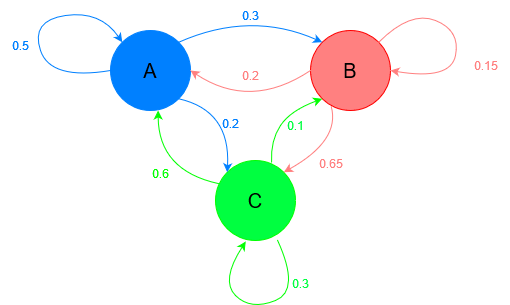



In [ ]:
class MarkovChain:
    def __init__(self, transition_matrix, states):
        self.transition_matrix = np.array(transition_matrix)
        self.states = states
        self.state_index = {state: idx for idx, state in enumerate(states)}
        self.current_state = None

    def set_initial_state(self, state):
        if state not in self.states:
            raise ValueError("State not in the list of possible states.")
        self.current_state = state

    def next_state(self):
        if self.current_state is None:
            raise ValueError("Initial state not set.")

        current_index = self.state_index[self.current_state]
        next_state_index = np.random.choice(len(self.states), p=self.transition_matrix[current_index])
        self.current_state = self.states[next_state_index]
        return self.current_state

    def generate_states(self, num_steps):
        if self.current_state is None:
            raise ValueError("Initial state not set.")

        states = [self.current_state]
        for _ in range(num_steps):
            states.append(self.next_state())
        return states

    def find_stationary_distribution(self):
      eigenvalues, eigenvectors = np.linalg.eig(self.transition_matrix.T)

      # Find the eigenvector corresponding to the eigenvalue 1
      stationary_vector = eigenvectors[:, np.isclose(eigenvalues, 1)]

      stationary_distribution = stationary_vector / stationary_vector.sum()

      return stationary_distribution.real.flatten()

In [ ]:
# Example usage

transition_matrix = [
    [0.5, 0.3, 0.2],
    [0.2, 0.15, 0.65],
    [0.6, 0.1, 0.3]
]

states = ["A", "B", "C"]

# Create the Markov Chain
mc = MarkovChain(transition_matrix, states)

# Set the initial state
mc.set_initial_state("A")

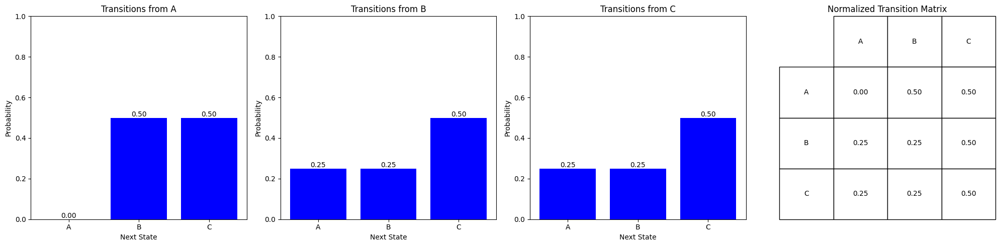

In [ ]:
def ax_to_table(ax, grid_data, states):
  """Take in an axs and transition probabilities, put T on the axis"""
  ax.set_axis_off()

  table = Table(ax, bbox=[0, 0, 1, 1])

  # Add cells for the matrix
  nrows, ncols = grid_data.shape
  width, height = 1.0 / ncols, 1.0 / nrows

  # Add header row and column
  for i in range(len(states)):
      table.add_cell(0, i + 1, width, height, text=states[i], loc='center', facecolor='white')
      table.add_cell(i + 1, 0, width, height, text=states[i], loc='center', facecolor='white')

  # Add the cell values
  for (i, j), val in np.ndenumerate(grid_data):
      table.add_cell(i + 1, j + 1, width, height, text=f'{val:.2f}', loc='center', facecolor='white')

  # Add the table to the axes
  ax.add_table(table)
  ax.set_title('Normalized Transition Matrix')

def plot_transition_distribution(mc, generated_states):
  # Initialize the transition count dictionary
  transition_counts = {state: {next_state: 0 for next_state in mc.states} for state in mc.states}

  # Count the transitions
  for i in range(len(generated_states) - 1):
      current_state = generated_states[i]
      next_state = generated_states[i + 1]
      transition_counts[current_state][next_state] += 1

  # Normalize the transition counts so they add to 1 for each state
  transition_probabilities = {state: {next_state: 0 for next_state in mc.states} for state in mc.states}
  for state, next_states in transition_counts.items():
      total = sum(next_states.values())
      if total > 0:
          transition_probabilities[state] = {next_state: count / total for next_state, count in next_states.items()}

  # Plot the transition probabilities
  num_states = len(mc.states)
  fig, axs = plt.subplots(1, num_states + 1, figsize=(5 * (num_states + 1), 5))

  # Subplots for each state's transitions
  for idx, state in enumerate(mc.states):
      ax = axs[idx]
      next_states = transition_probabilities[state]
      bars = ax.bar(next_states.keys(), next_states.values(), color='blue')
      ax.set_title(f'Transitions from {state}')
      ax.set_xlabel('Next State')
      ax.set_ylabel('Probability')
      ax.set_ylim(0, 1)
      # Add probability labels on each bar
      for bar, prob in zip(bars, next_states.values()):
          yval = bar.get_height()
          ax.text(bar.get_x() + bar.get_width()/2, yval, f'{prob:.2f}', ha='center', va='bottom')

  # Grid plot for comparing with the transition matrix
  ax = axs[-1]
  grid_data = np.array([[transition_probabilities[state][next_state] for next_state in mc.states] for state in mc.states])

  ax_to_table(ax, grid_data, mc.states)

  plt.tight_layout()
  plt.savefig('transition_distribution.png')
  plt.show()

generated_states = mc.generate_states(10)
# Plot the transition distribution
plot_transition_distribution(mc, generated_states)

In [ ]:
def estimate_transition_matrix(generated_states, states):
  transition_counts = {state: {next_state: 0 for next_state in states} for state in states}

  for i in range(len(generated_states) - 1):
      current_state = generated_states[i]
      next_state = generated_states[i + 1]
      transition_counts[current_state][next_state] += 1

  estimated_transition_matrix = np.array([
      [transition_counts[state][next_state] / sum(transition_counts[state].values()) if sum(transition_counts[state].values()) > 0 else 0
      for next_state in states] for state in states
  ])
  return estimated_transition_matrix

def create_figure():
  fig = plt.figure(figsize=(12, 4))
  gs = GridSpec(1, 2, width_ratios=[7, 3])
  ax0 = fig.add_subplot(gs[0])
  ax1 = fig.add_subplot(gs[1])
  return fig, ax0, ax1


def plot_frame(ax0, ax1, euclidean_distances, estimated_transition_matrix, states):
  ax0.clear()
  ax1.clear()

  # Plot Euclidean distance
  ax0.plot(range(len(euclidean_distances)), euclidean_distances, label='Euclidean Distance')
  ax0.set_xlabel('Steps in trajectory')
  ax0.set_ylabel("|| T - T' ||")
  ax0.set_title('Convergence of Transition Matrix')
  ax0.legend()

  # Plot estimated transition matrix
  ax_to_table(ax1, estimated_transition_matrix, states)


def plot_transition_matrix_convergence(mc, total_steps, gif_filename='transition_matrix_convergence.gif', fps = 20):
  euclidean_distances = []


  generated_states = mc.generate_states(total_steps)
  images = []
  estimated_transition_matrix = None

  frames_after = fps * 2
  for num_steps in range(total_steps + frames_after):
      fig, ax0, ax1 = create_figure()

      if num_steps < total_steps:
        sliced_states = generated_states[:num_steps]
        estimated_transition_matrix = estimate_transition_matrix(sliced_states, mc.states)

        # Calculate Euclidean distance
        distance = np.linalg.norm(estimated_transition_matrix - mc.transition_matrix)
        euclidean_distances.append(distance)

      # Plot frame
      plot_frame(ax0, ax1, euclidean_distances, estimated_transition_matrix, mc.states)
      ax0.set_xlim(0, total_steps)
      ax0.set_ylim(0, 1.5)
      # Save frame to BytesIO object
      buf = BytesIO()
      plt.savefig(buf, format='png')
      buf.seek(0)
      images.append(imageio.v2.imread(buf))
      buf.close()
      plt.close(fig)


  # Create GIF
  imageio.mimsave(gif_filename, images, fps = fps, loop = 0)

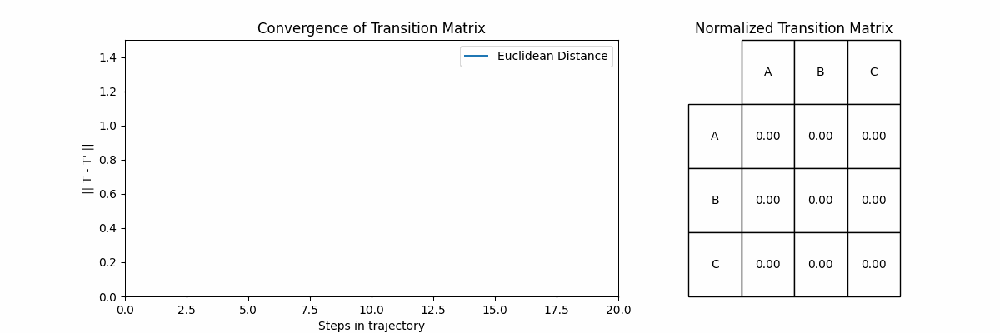

In [ ]:
# Plot the convergence of the transition matrix
# Darker is further away, lighter is closer

gif_filename = 'convergence.gif'
plot_transition_matrix_convergence(mc, total_steps = 20, gif_filename = gif_filename)
display(Image(filename=gif_filename))

In [ ]:
stationary_distribution = mc.find_stationary_distribution()
print("Stationary distribution:", stationary_distribution)

Stationary distribution: [0.47111111 0.20444444 0.32444444]


In [ ]:
def plot_state_frame(mc, ax, state_percentages, stationary_percentages, num_steps):
        ax.clear()

        bars = ax.bar(state_percentages.keys(), state_percentages.values(), color='c')

        # Add percentage labels on each bar
        for bar, percentage in zip(bars, state_percentages.values()):
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, yval, f'{percentage:.2f}%', ha='center', va='bottom')

        # Overlay the stationary distribution
        for state, percentage in stationary_percentages.items():
            ax.hlines(y=percentage, xmin=-0.5, xmax=len(mc.states)-0.5, colors='r', linestyles='dashed')
            ax.text(len(mc.states)-0.5, percentage, f'{percentage:.2f}%', color='r', va='center')

        ax.set_xlabel('State')
        ax.set_ylabel('Percentage of Time (%)')
        ax.set_ylim(0, 100)  # Ensure the y-axis goes from 0 to 100%
        ax.set_title(f'State Distribution for {num_steps} Steps')

def plot_convergence_to_stationary_distribution(mc, total_steps, step_interval, gif_filename='convergence_to_stationary_distribution.gif'):
    # Find the stationary distribution analytically
    stationary_distribution = mc.find_stationary_distribution()
    stationary_percentages = {state: percentage * 100 for state, percentage in zip(mc.states, stationary_distribution)}

    generated_states = mc.generate_states(total_steps)
    images = []

    for num_steps in range(step_interval, total_steps + step_interval, step_interval):
        fig, ax = plt.subplots(figsize=(8, 6))

        sliced_states = generated_states[:num_steps]

        # Count the occurrences of each state
        state_counts = {state: 0 for state in mc.states}
        for state in sliced_states:
            state_counts[state] += 1

        # Calculate the total number of steps and the percentages
        total_steps_current = len(sliced_states)
        state_percentages = {state: count / total_steps_current * 100 for state, count in state_counts.items()}

        # Plot frame
        plot_state_frame(mc, ax, state_percentages, stationary_percentages, num_steps)

        # Save frame to BytesIO object
        buf = BytesIO()
        plt.savefig(buf, format='png')
        buf.seek(0)
        images.append(imageio.v2.imread(buf))
        buf.close()
        plt.close(fig)

    # Add final frame 10 more times to create a pause effect
    final_state_counts = {state: 0 for state in mc.states}
    for state in generated_states:
        final_state_counts[state] += 1
    final_state_percentages = {state: count / total_steps * 100 for state, count in final_state_counts.items()}

    for _ in range(10):
        fig, ax = plt.subplots(figsize=(8, 6))
        plot_state_frame(mc, ax, final_state_percentages, stationary_percentages, total_steps)

        buf = BytesIO()
        plt.savefig(buf, format='png')
        buf.seek(0)
        images.append(imageio.v2.imread(buf))
        buf.close()
        plt.close(fig)

    # Create GIF
    imageio.mimsave(gif_filename, images, fps=5, loop=0)


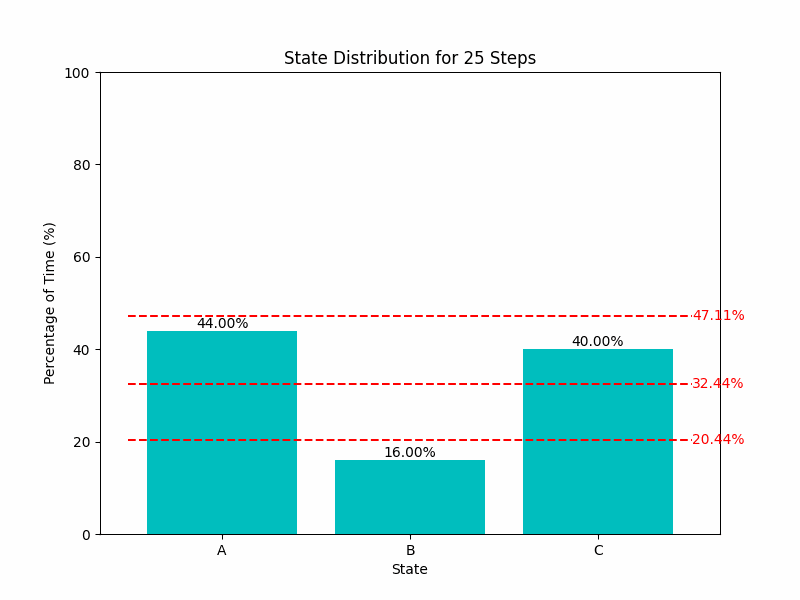

In [ ]:
# Plot the convergence of the state distribution
plot_convergence_to_stationary_distribution(mc, 750, 25, gif_filename='stationary_distribution.gif')
display(Image(filename='stationary_distribution.gif'))

Recovering Unknown States

In [ ]:
num_states = 4
states = ["A", "B", "C", "D"]
transition_matrix = np.random.rand(num_states, num_states)
transition_matrix = transition_matrix / transition_matrix.sum(axis=1)[:, np.newaxis]

mc = MarkovChain(transition_matrix, states)
mc.set_initial_state("C")

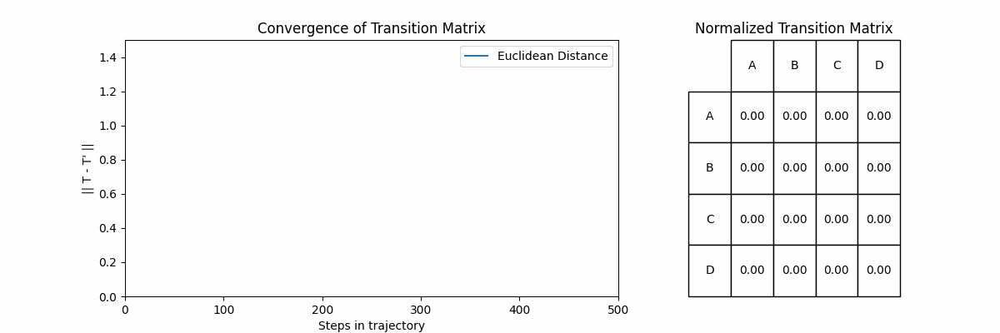

In [ ]:
plot_transition_matrix_convergence(mc, total_steps = 500, gif_filename = 'unknown_convergence.gif')
display(Image(filename='unknown_convergence.gif'))

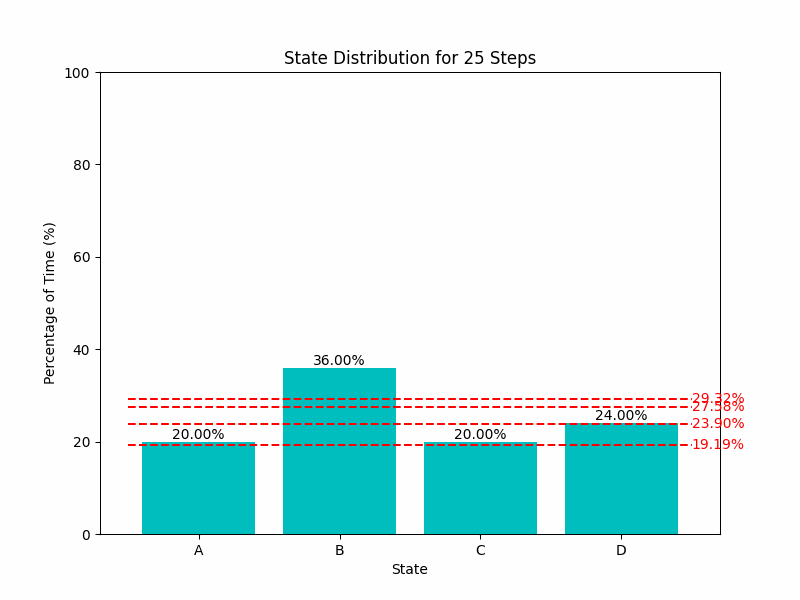

In [ ]:
plot_convergence_to_stationary_distribution(mc,1000, 25, gif_filename='unknown_stationary_distribution.gif')
display(Image(filename='unknown_stationary_distribution.gif'))

#Intro to MCMC Methods

Estimated Pi: 3.1368


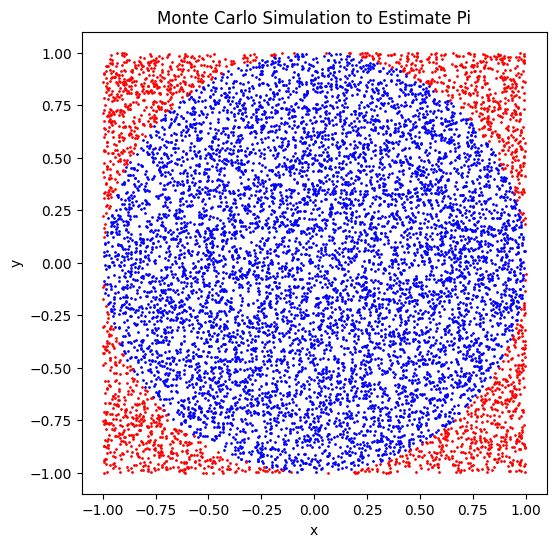

In [ ]:
# Estimate the value of Pi using simple Monte Carlo simulation
def estimate_pi(num_samples):
    inside_circle = 0
    for _ in range(num_samples):
        x, y = np.random.uniform(-1, 1, 2)
        if x**2 + y**2 <= 1:
            inside_circle += 1
    return (inside_circle / num_samples) * 4

num_samples = 10000
pi_estimate = estimate_pi(num_samples)
print(f"Estimated Pi: {pi_estimate}")

# Plotting the simulation
x = np.random.uniform(-1, 1, num_samples)
y = np.random.uniform(-1, 1, num_samples)
inside_circle = x**2 + y**2 <= 1

plt.figure(figsize=(6,6))
plt.scatter(x[inside_circle], y[inside_circle], color='blue', s=1)
plt.scatter(x[~inside_circle], y[~inside_circle], color='red', s=1)
plt.title("Monte Carlo Simulation to Estimate Pi")
plt.xlabel("x")
plt.ylabel("y")
plt.savefig('pi.png')
plt.show()

<ipython-input-26-f5b18228dd27>:33: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(buf)


GIF saved as brownian_motion.gif


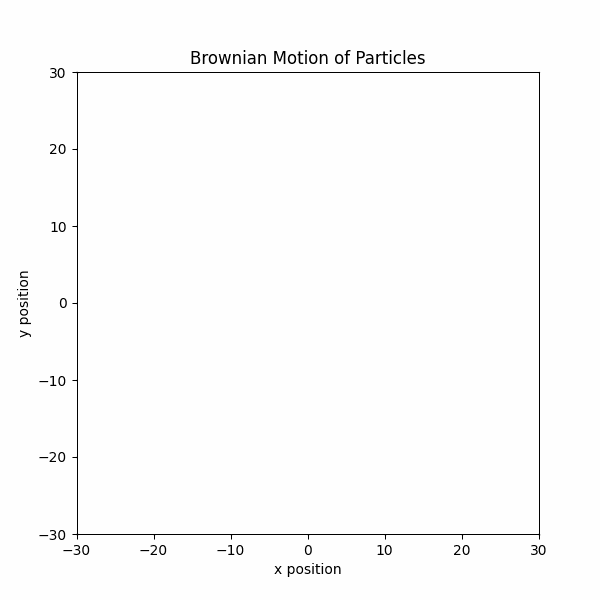

In [ ]:

def brownian_motion_gif(num_particles=100, num_steps=1000, delta_t=1, diffusion_coefficient=1, xlim=(-30, 30), ylim=(-30, 30), gif_name='brownian_motion.gif'):
    # Step 1: Define the domain of possible inputs (initial positions and random displacements)
    positions = np.zeros((num_particles, 2))
    all_positions = np.zeros((num_steps, num_particles, 2))

    # Simulate the Brownian motion
    # Step 2: Generate inputs randomly from a probability distribution (random displacements)
    for t in range(num_steps):
        # Random displacements
        displacements = np.sqrt(2 * diffusion_coefficient * delta_t) * np.random.normal(size=(num_particles, 2))
        # Step 3: Perform a deterministic computation (update positions)
        positions += displacements
        all_positions[t] = positions

    # Create GIF in memory
    # Step 4: Aggregate the results (store and visualize positions)
    with imageio.get_writer(gif_name, mode='I', fps=30, loop=0) as writer:
        for t in range(num_steps):
            plt.figure(figsize=(6, 6))
            for i in range(num_particles):
                plt.plot(all_positions[:t+1, i, 0], all_positions[:t+1, i, 1], alpha=0.6)
            plt.xlim(xlim)
            plt.ylim(ylim)
            plt.title('Brownian Motion of Particles')
            plt.xlabel('x position')
            plt.ylabel('y position')
            plt.gca().set_aspect('equal', adjustable='box')

            buf = io.BytesIO()
            plt.savefig(buf, format='png')
            plt.close()
            buf.seek(0)
            image = imageio.imread(buf)
            writer.append_data(image)

    print(f"GIF saved as {gif_name}")

# Example usage
brownian_motion_gif(20, num_steps=100, delta_t=1, diffusion_coefficient=1, xlim=(-30, 30), ylim=(-30, 30), gif_name='brownian_motion.gif')

display(Image(filename='brownian_motion.gif'))

# Metropolis Hasting

<ipython-input-49-904aea24394e>:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax0 = plt.subplot(gs[0])


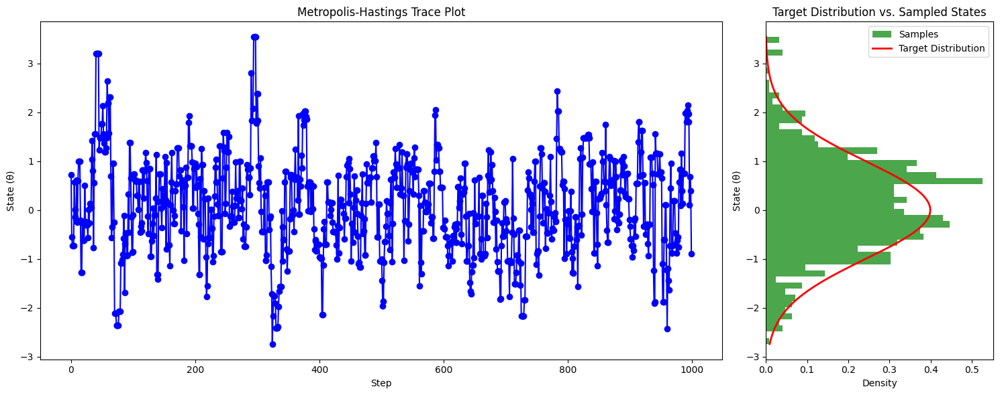

In [ ]:

def target_distribution(x):
    # Example target distribution: a standard normal distribution
    return np.exp(-0.5 * x**2) / np.sqrt(2 * np.pi)

def proposal_distribution(x):
    # Example proposal distribution: a normal distribution centered at x with some standard deviation
    return np.random.normal(x, 1)

def metropolis_hastings(target_dist, proposal_dist, initial_state, num_samples):
    samples = []
    current_state = initial_state

    for _ in range(num_samples):
        proposed_state = proposal_dist(current_state)
        acceptance_ratio = target_dist(proposed_state) / target_dist(current_state)

        if np.random.rand() < acceptance_ratio:
            current_state = proposed_state

        samples.append(current_state)

    return np.array(samples)

# Parameters
initial_state = 0
num_samples = 1000

# Generate samples using Metropolis-Hastings algorithm
samples = metropolis_hastings(target_distribution, proposal_distribution, initial_state, num_samples)

# Plot the Metropolis-Hastings process
fig, ax = plt.subplots(1, 2, figsize=(15, 6))  # Create 1 row, 2 column subplots
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # 3:1 ratio

# Subplot 1: Trace plot of the samples
ax0 = plt.subplot(gs[0])
ax0.plot(samples, marker='o', linestyle='-', color='b')
ax0.set_title('Metropolis-Hastings Trace Plot')
ax0.set_xlabel('Step')
ax0.set_ylabel('State (θ)')

# Subplot 2: Histogram of the samples and target distribution, rotated by 90 degrees
ax1 = plt.subplot(gs[1])
ax1.hist(samples, bins=50, density=True, alpha=0.7, color='g', orientation='horizontal', label='Samples')
x = np.linspace(min(samples), max(samples), 1000)
ax1.plot(target_distribution(x), x, 'r-', lw=2, label='Target Distribution')  # Rotate the target distribution plot
ax1.set_title('Target Distribution vs. Sampled States')
ax1.set_xlabel('Density')
ax1.set_ylabel('State (θ)')
ax1.legend()

plt.tight_layout()
plt.savefig('metropolis_hastings.png')
plt.show()


<ipython-input-29-e5c93380ae1c>:37: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames.append(imageio.imread(buf))


GIF saved as metropolis_hastings.gif


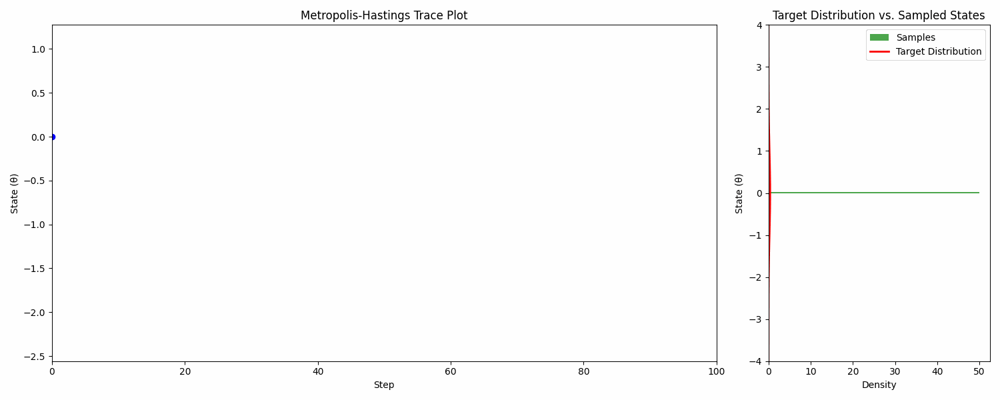

In [ ]:
#TODO combine code with above to make one function that we can call

def create_gif(samples, target_dist, gif_name='metropolis_hastings.gif'):
    num_samples = len(samples)
    frames = []

    for i in range(1, num_samples + 1):
        fig = plt.figure(figsize=(15, 6))
        gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # 3:1 ratio

        # Subplot 1: Trace plot of the samples
        ax0 = plt.subplot(gs[0])
        ax0.plot(samples[:i], marker='o', linestyle='-', color='b')
        ax0.set_title('Metropolis-Hastings Trace Plot')
        ax0.set_xlabel('Step')
        ax0.set_ylabel('State (θ)')
        ax0.set_xlim(0, num_samples)
        ax0.set_ylim(min(samples), max(samples))

        # Subplot 2: Histogram of the samples and target distribution, rotated by 90 degrees
        ax1 = plt.subplot(gs[1])
        ax1.hist(samples[:i], bins=50, density=True, alpha=0.7, color='g', orientation='horizontal', label='Samples')
        x = np.linspace(-4, 4, 1000)
        ax1.plot(target_distribution(x), x, 'r-', lw=2, label='Target Distribution')  # Rotate the target distribution plot
        ax1.set_title('Target Distribution vs. Sampled States')
        ax1.set_xlabel('Density')
        ax1.set_ylabel('State (θ)')
        ax1.set_ylim(-4, 4)
        ax1.legend()

        plt.tight_layout()

        buf = io.BytesIO()
        plt.savefig(buf, format='png')
        plt.close()
        buf.seek(0)
        frames.append(imageio.imread(buf))

    imageio.mimsave(gif_name, frames, fps=10, loop = 0)
    print(f"GIF saved as {gif_name}")

# Parameters
initial_state = 0
num_samples = 100

# Generate samples using Metropolis-Hastings algorithm
samples = metropolis_hastings(target_distribution, proposal_distribution, initial_state, num_samples)

# Create and save the GIF
create_gif(samples, target_distribution, gif_name='metropolis_hastings.gif')
display(Image(filename='metropolis_hastings.gif'))

Integrating

In [ ]:
# Define the observed function
def observed_function(x1, x2):
    return x1**2 + x2**2

# Define the probability distribution
mean = np.array([0, 0])
cov = np.array([[1, 0.5], [0.5, 1]])
rv = multivariate_normal(mean, cov)

# Define the integrand (observed function * probability density function)
def integrand(x1, x2):
    return observed_function(x1, x2) * rv.pdf([x1, x2])

# Set the integration limits
integration_limits = [(-np.inf, np.inf), (-np.inf, np.inf)]

# Perform the integration
integral_result, _ = nquad(integrand, integration_limits)

print(f"Integral result: {round(integral_result, 3)}")



Integral result: 2.0


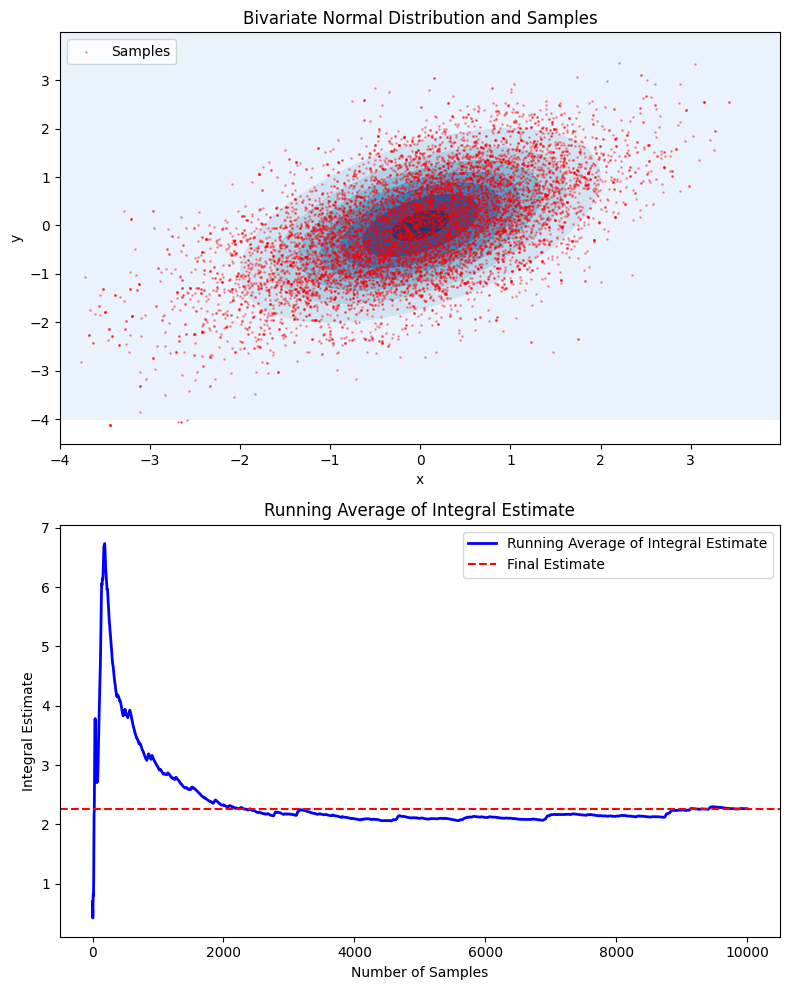

Final Estimate: 2.263803902356741


In [ ]:
def target_distribution(x, y):
    # Bivariate normal distribution
    mu = np.array([0, 0])
    sigma = np.array([[1, 0.5], [0.5, 1]])
    return multivariate_normal.pdf([x, y], mean=mu, cov=sigma)

def proposal_distribution(x, y):
    # Proposal distribution: normal distribution centered at (x, y)
    # Our proposal density is symmetric, so g(x|x') = g(x'|x), makes the acceptance ratio easier to compute
    step_size = 0.5
    return np.random.normal([x, y], step_size, 2)

def metropolis_hastings_2d(target_dist, proposal_dist, initial_state, num_samples):
    samples = []
    current_state = initial_state

    for _ in range(num_samples):
        proposed_state = proposal_dist(*current_state)
        acceptance_ratio = target_dist(*proposed_state) / target_dist(*current_state)

        if np.random.rand() < acceptance_ratio:
            current_state = proposed_state

        samples.append(current_state)

    return np.array(samples)

# Parameters
initial_state = [0, 0]
num_samples = 10000

# Generate samples using Metropolis-Hastings algorithm
samples = metropolis_hastings_2d(target_distribution, proposal_distribution, initial_state, num_samples)

# Function to integrate
f = lambda x, y: x**2 + y**2

# Running average of the integral estimate
f_values = np.array([f(x, y) for x, y in samples])
running_avg = np.cumsum(f_values) / np.arange(1, num_samples + 1)

# Plot the target distribution and samples
x, y = np.mgrid[-4:4:.01, -4:4:.01]
pos = np.dstack((x, y))
rv = multivariate_normal([0, 0], [[1, 0.5], [0.5, 1]])

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

# Plot the samples and the contour of the target distribution
ax1.contourf(x, y, rv.pdf(pos), cmap='Blues')
ax1.scatter(samples[:, 0], samples[:, 1], s=1, color='r', alpha=0.3, label='Samples')
ax1.set_title('Bivariate Normal Distribution and Samples')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.legend()

# Plot running average of the integral estimate
ax2.plot(running_avg, color='b', lw=2, label='Running Average of Integral Estimate')
ax2.axhline(y=np.mean(f_values), color='r', linestyle='--', label='Final Estimate')
ax2.set_title('Running Average of Integral Estimate')
ax2.set_xlabel('Number of Samples')
ax2.set_ylabel('Integral Estimate')
ax2.legend()

plt.tight_layout()
plt.savefig('metropolis_hastings_2d.png')

plt.show()

print(f"Final Estimate: {running_avg[-1]}")
